**Краткое описание проекта**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве.

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты.

# Исследование рынка заведений общественного питания Москвы

1. [Открытие данных](#start)
2. [Предобработка данных](#prework)
    * [Обработка пропущенных значений](#missing)
    * [Обработка дубликатов](#duplicates)
    * [Добавление столбцов](#column)
3. [Анализ данных](#analysis)
    * [Количество объектов общественного питания по категориям](#cafecat)
    * [Количество посадочных мест в местах по категориям](#seatscat)
    * [Соотношение сетевых и несетевых заведений](#netnotnet)
    * [Распределение категорий сетевых заведений](#onlynetcat)
    * [Топ-15 популярных сетей в Москве](#nets)
    * [Количество заведений каждой категории по районам](#catregion)
    * [Распределение средних рейтингов по категориям заведений](#avcat)
    * [Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района](#choroav)
    * [Все заведения датасета на карте](#cart)
    * [Топ-15 улиц по количеству заведений](#15streets)
    * [Улицы, на которых находится только один объект общепита](#only1)
    * [Анализ средних чеков по зваедениям](#avcheck)
    * [Вывод](#allinall)
4. [Детализация исследования](#freeanalysis)
5. [Вывод](#allinallishe)
6. [Рекомендации](#reks)

Презентация: <https://disk.yandex.ru/d/FV8FUmZWT9EZfA> 

## Открытие данных <a id="start"></a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from plotly import graph_objects as go
import plotly.express as px
import json
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
pd.set_option('display.max_columns', None)
path = 'C://Users/123/projects/'
try:
    data = pd.read_csv(path + 'moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Посмотрим на количественные значения

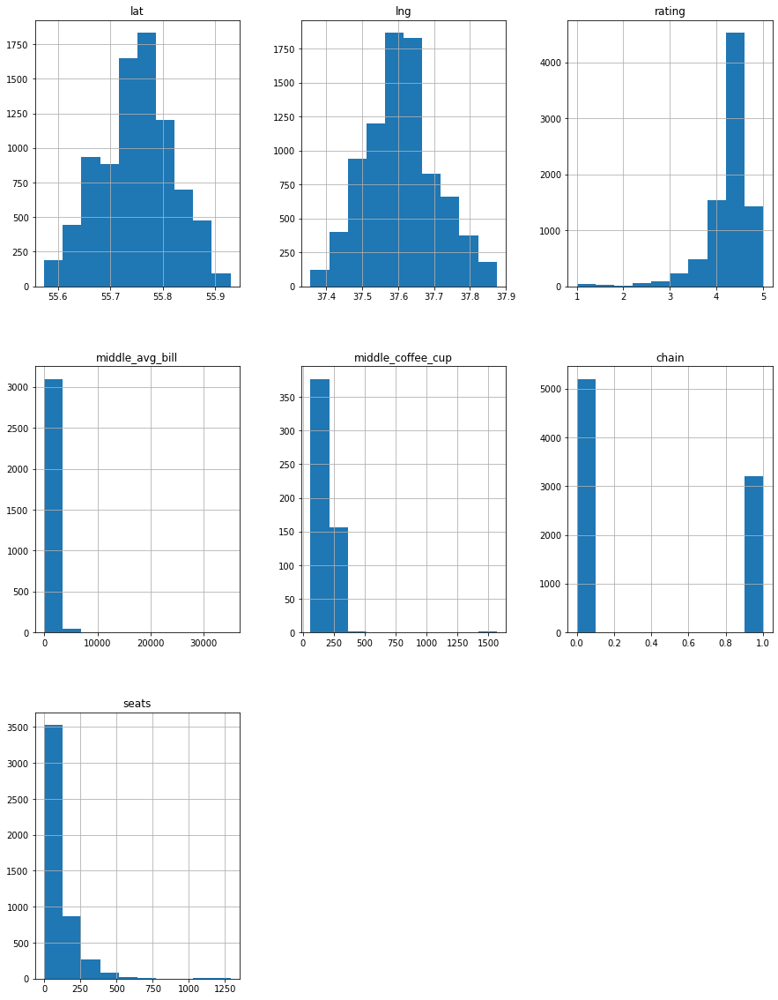

In [4]:
data.hist(figsize=(15, 20));

Всего в датасете 8406 строк и 14 столбцов:
- `name` — название заведения, имеет строковый тип;
- `address` — адрес заведения, имеет строковый тип;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня», имеет строковый тип;
- `hours` — информация о днях и часах работы, имеет строковый тип;
- `lat` — широта географической точки, в которой находится заведение, имеет вещественный тип;
- `lng` — долгота географической точки, в которой находится заведение, имеет вещественный тип;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0), имеет вещественный тип;
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее, имеет строковый тип;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
      и так далее;
- `middle_avg_bill` — число вещественного типа с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число вещественного типа с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — целое число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ, имеет строковый тип;
- `seats` — количество посадочных мест, имеет вещественный тип.

Стоит отметить, что значений из `middle_avg_bill` и `middle_coffee_cup` в совокупности меньше, чем в `avg_bill`, т.к. они охватывают не все заведения, например заведение со значением `avg_bill` «Цена бокала пива: 400–600 ₽» не будет иметь выраженного числом оценки среднего чека.
Значения в `seats` имеют вещественный тип, хотя навряд ли количество мест может быть нецелым.

## Предобработка данных <a id="prework"></a>

### Обработка пропущенных значений <a id="missing"></a>

Посмотрим на пропуски в часах работы предприятий

In [5]:
data.query('hours.isna()')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,Ижора,булочная,"Москва, Ижорский проезд, 5А",Северный административный округ,NaN,55.888366,37.514856,4.4,NaN,NaN,NaN,NaN,0,NaN
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN
44,Кафетерий,кафе,"Москва, Ангарская улица, 24А",Северный административный округ,NaN,55.876289,37.519315,3.8,NaN,NaN,NaN,NaN,1,8.0
56,Рыба из тандыра,быстрое питание,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.888010,37.515960,1.5,NaN,NaN,NaN,NaN,0,NaN
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8236,1у,кафе,"Москва, Нагатинская набережная, 40/1к1",Южный административный округ,NaN,55.685528,37.673546,3.4,NaN,NaN,NaN,NaN,0,NaN
8375,Улица Гурьянова 55,кафе,"Москва, улица Гурьянова, 55",Юго-Восточный административный округ,NaN,55.679981,37.717034,4.5,NaN,NaN,NaN,NaN,0,NaN
8378,Восточно-грузинская кухня,быстрое питание,"Москва, Зеленодольская улица, 32, корп. 3",Юго-Восточный административный округ,NaN,55.710540,37.767864,4.3,NaN,NaN,NaN,NaN,0,120.0
8381,Аэлита,кафе,"Москва, Ферганская улица, 8, корп. 2, стр. 1",Юго-Восточный административный округ,NaN,55.708871,37.803831,3.8,NaN,NaN,NaN,NaN,0,30.0


Возможно при заполнении датасета не было информации о часах работы некоторых заведений, лучше оставить их как есть.
Посмотрим на пропуски в `price`, может быть мы сможем заполнить их,  учитывая значения в `middle_avg_bill` и `middle_coffee_cup`

<AxesSubplot:xlabel='price', ylabel='middle_avg_bill'>

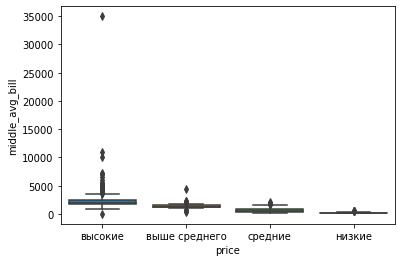

In [6]:
sns.boxplot(x='price', y='middle_avg_bill', data=data.sort_values(by='middle_avg_bill', ascending=False))

Как мы видим есть один выброс, который мешает исследованию, удалим строку со средним чеком более 30000

In [7]:
data = data.query('middle_avg_bill < 30000 | middle_avg_bill.isna()')
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8405 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8405 non-null   object 
 1   category           8405 non-null   object 
 2   address            8405 non-null   object 
 3   district           8405 non-null   object 
 4   hours              7869 non-null   object 
 5   lat                8405 non-null   float64
 6   lng                8405 non-null   float64
 7   rating             8405 non-null   float64
 8   price              3314 non-null   object 
 9   avg_bill           3815 non-null   object 
 10  middle_avg_bill    3148 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8405 non-null   int64  
 13  seats              4794 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 985.0+ KB


Text(0, 0.5, 'Средний чек')

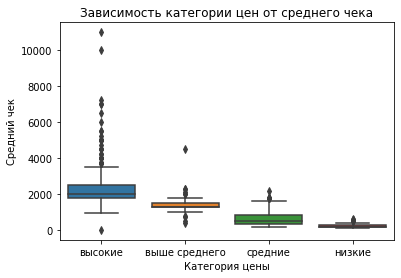

In [8]:
ax = sns.boxplot(x='price', y='middle_avg_bill', data=data.sort_values(by='middle_avg_bill', ascending=False))
ax.set_title('Зависимость категории цен от среднего чека')
ax.set_xlabel('Категория цены')
ax.set_ylabel('Средний чек')

Посмеотрим есть ли вообще строки, в которых нет среднего чека и категории цены

In [9]:
data.query('price.isna() & ~middle_avg_bill.isna() & ~middle_coffee_cup.isna()')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Из этого следует, что заполнять таким образом нечего, но теперь у нас есть уверенность в том, что между категорией цены и средним чеком в данных есть прямая взаимосвязь, средний чек возрастает от категории "низкие" к категории "высокие"

Посмотрим на взаимосвязь категории цены и рейтинга

Text(0, 0.5, 'Рейтинг')

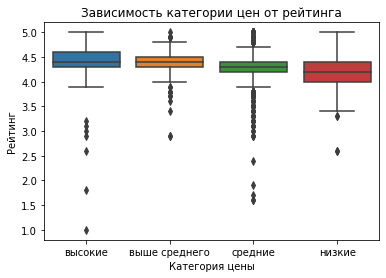

In [10]:
list_order = list(data
                  .pivot_table(index='price', values='rating', aggfunc='median')
                  .reset_index()
                  .sort_values(by='rating', ascending=False)
                  ['price']
                 ) #просто отсортировать средние чеки тут не получилось, поэтому создал список с нужным порядком категории цены
ax = sns.boxplot(x='price', y='rating', data=data, order=list_order) #положил его в order
ax.set_title('Зависимость категории цен от рейтинга')
ax.set_xlabel('Категория цены')
ax.set_ylabel('Рейтинг')

Зависимость есть, но не достаточно сильная, чтобы на этой основе заполнять пропуски, пропуски в seats оставим

### Обработка дубликатов <a id="duplicates"></a>

In [11]:
data.duplicated().sum()

0

Посмотрим на дупликаты в name

In [12]:
data['name'].value_counts().head(20)

Кафе                                   188
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
Шаурма                                  43
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
Ресторан                                34
CofeFest                                32
Буханка                                 32
Столовая                                28
Му-Му                                   27
Drive Café                              24
Name: name, dtype: int64

In [13]:
data['name'].duplicated().sum()

2791

В этом столбце довольно много повторяющихся значений, но это неудивительно, ведь, например, во многих строчках в названии стоит просто "Кафе", а так же присутствуют сетевые предприятия

In [14]:
data['address'].duplicated().sum()

2653

In [15]:
data['address'].value_counts().head(20)

Москва, проспект Вернадского, 86В          28
Москва, Усачёва улица, 26                  26
Москва, площадь Киевского Вокзала, 2       20
Москва, Ярцевская улица, 19                20
Москва, Каширское шоссе, 61Г               16
Москва, Хорошёвское шоссе, 27              16
Москва, Пресненская набережная, 2          16
Москва, Лесная улица, 20, стр. 3           16
Москва, проспект Мира, 211к2               16
Москва, Щёлковское шоссе, вл75             16
Москва, Профсоюзная улица, 56              15
Москва, улица Авиаконструктора Миля, 3А    15
Москва, проспект Мира, 211, корп. 2        15
Москва, Мытная улица, 74                   14
Москва, улица Вавилова, 64/1с1             14
Москва, улица Вавилова, 3                  14
Москва, проспект Вернадского, 86А          12
Москва, Варшавское шоссе, 140              11
Москва, Хабаровская улица, 15              11
Москва, Электродная улица, 2, стр. 32      11
Name: address, dtype: int64

Это вполне себе нормально, т.к. кафе могут находиться в фудхоллах, например на проспекте Вернадского 86В находится ТЦ возле моего университета, а на проспекте Мира трк "Европолис", во всех остальных колонках обраатывать дупликаты смысла не вижу. Разве что проверим строки где повторяются и `name`, и `address`

In [16]:
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()

In [17]:
data[['name', 'address']].duplicated().sum()

4

In [18]:
data = data.drop_duplicates(subset=['name', 'address'])

In [19]:
data[['name', 'address']].duplicated().sum()

0

Посмотрим на столбец `seats`, в нём находтся значения вещественного типа

In [20]:
data['seats']

0         NaN
1         4.0
2        45.0
3         NaN
4       148.0
        ...  
8401     86.0
8402    150.0
8403    150.0
8404    150.0
8405     12.0
Name: seats, Length: 8401, dtype: float64

Преобразуем значения в тип `int`

In [21]:
def converting(x):
    try:
        return int(round(x))
    except:
        return -1
data['seats'] = data['seats'].apply(converting)

In [22]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8401 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8401 non-null   object 
 1   category           8401 non-null   object 
 2   address            8401 non-null   object 
 3   district           8401 non-null   object 
 4   hours              7866 non-null   object 
 5   lat                8401 non-null   float64
 6   lng                8401 non-null   float64
 7   rating             8401 non-null   float64
 8   price              3314 non-null   object 
 9   avg_bill           3815 non-null   object 
 10  middle_avg_bill    3148 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8401 non-null   int64  
 13  seats              8401 non-null   int64  
dtypes: float64(5), int64(2), object(7)
memory usage: 984.5+ KB


### Добавление столбцов <a id="column"></a>

Столбец `street` с названиями улиц из столбца с адресом

In [23]:
data['address'].unique()[:20]

array(['москва, улица дыбенко, 7/1', 'москва, улица дыбенко, 36, корп. 1',
       'москва, клязьминская улица, 15',
       'москва, улица маршала федоренко, 12',
       'москва, правобережная улица, 1б', 'москва, ижорская улица, вл8б',
       'москва, клязьминская улица, 9, стр. 3',
       'москва, дмитровское шоссе, 107, корп. 4',
       'москва, ангарская улица, 39', 'москва, левобережная улица, 12',
       'москва, улица маршала федоренко, 10с1',
       'москва, мкад, 80-й километр, 1',
       'москва, базовская улица, 15, корп. 1',
       'москва, ангарская улица, 42с1',
       'москва, улица бусиновская горка, 2',
       'москва, базовская улица, 15, корп. 8',
       'москва, ленинградское шоссе, 71б, стр. 2',
       'москва, коровинское шоссе, 30а', 'москва, ижорский проезд, 5',
       'москва, прибрежный проезд, 7'], dtype=object)

In [24]:
def street_finder(row):
    try:
        array = row['address'].split(sep=', ')
        return array[1]
    except:
        return 'нет улицы'
    
data['street'] = data.apply(street_finder, axis=1)

In [25]:
data['street'].unique()

array(['улица дыбенко', 'клязьминская улица', 'улица маршала федоренко',
       ..., 'улица хлобыстова', 'новороссийская улица',
       'чонгарский бульвар'], dtype=object)

столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение `True` — если заведение работает ежедневно и круглосуточно;
- логическое значение `False` — в противоположном случае

In [26]:
def finder(hour):
    if 'ежедневно' in str(hour):
        print(hour)
data['hours'].apply(finder)

ежедневно, 10:00–22:00
ежедневно, 10:00–22:00
ежедневно, 09:00–22:00
ежедневно, 10:00–22:00
ежедневно, 10:00–23:00
ежедневно, 10:00–22:00
ежедневно, 12:00–00:00
ежедневно, круглосуточно
ежедневно, 10:00–21:00
ежедневно, 08:00–22:00
ежедневно, 13:00–00:00
ежедневно, 10:00–23:00
ежедневно, круглосуточно
ежедневно, 09:00–21:00
ежедневно, круглосуточно
ежедневно, 10:00–22:00
ежедневно, 10:00–22:00
ежедневно, 08:00–22:00
ежедневно, круглосуточно
ежедневно, 10:00–21:00
ежедневно, 10:00–19:00
ежедневно, 08:00–21:00
ежедневно, 10:00–22:00
ежедневно, 09:00–23:00
ежедневно, 10:00–21:00
ежедневно, 10:00–23:00
ежедневно, 09:00–23:00
ежедневно, 10:00–22:00
ежедневно, 08:00–23:00
ежедневно, 09:00–23:00
ежедневно, 10:00–22:00
ежедневно, 09:00–23:00
ежедневно, 10:00–23:00
ежедневно, 11:00–00:00
ежедневно, 10:00–22:00
ежедневно, круглосуточно
ежедневно, круглосуточно
ежедневно, 09:00–21:00
ежедневно, 08:00–22:00
ежедневно, 10:00–22:00
ежедневно, круглосуточно
ежедневно, 10:00–22:00
ежедневно, 09:00–02:

0       None
1       None
2       None
3       None
4       None
        ... 
8401    None
8402    None
8403    None
8404    None
8405    None
Name: hours, Length: 8401, dtype: object

In [27]:
def hour_24_finder(row):
    if 'ежедневно, круглосуточно' in str(row['hours']):
        return True
    else:
        return False
data['is_24_7'] = data.apply(hour_24_finder, axis=1)

In [28]:
data['is_24_7'].unique()

array([False,  True])

In [29]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8401 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8401 non-null   object 
 1   category           8401 non-null   object 
 2   address            8401 non-null   object 
 3   district           8401 non-null   object 
 4   hours              7866 non-null   object 
 5   lat                8401 non-null   float64
 6   lng                8401 non-null   float64
 7   rating             8401 non-null   float64
 8   price              3314 non-null   object 
 9   avg_bill           3815 non-null   object 
 10  middle_avg_bill    3148 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8401 non-null   int64  
 13  seats              8401 non-null   int64  
 14  street             8401 non-null   object 
 15  is_24_7            8401 non-null   bool   
dtypes: bool(1), float64(5), 

### Вывод
- Был проанализирован представленный датасет на наличие аномалий и дупликатов
- Были удалены 4 строки с повторяющимися значениями в `name` и `adress`
- Была удалена строка с аномалией в `middle_avg_bill`

## Анализ данных <a id="analysis"></a>

### Количество объектов общественного питания по категориям <a id="cafecat"></a>

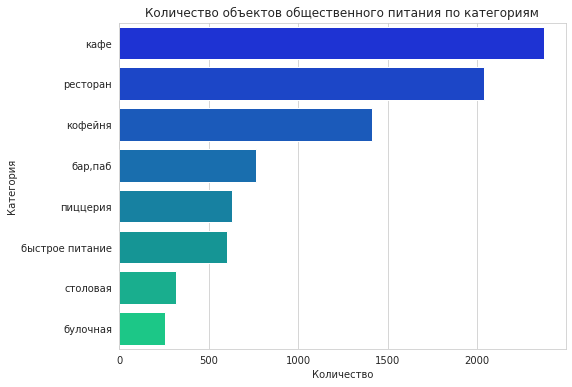

In [30]:
df = data.pivot_table(index='category', values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
plt.figure(figsize=(8, 6))
sns.set_style('whitegrid')
ax = sns.barplot(x='name', y='category', data=df, palette='winter')
plt.title('Количество объектов общественного питания по категориям')
plt.xlabel('Количество')
plt.ylabel('Категория')
plt.show()

In [31]:
df.sort_values(by='name', ascending=False)

,category,name
3,кафе,2376
6,ресторан,2041
4,кофейня,1413
0,"бар,паб",764
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


Наиболее распространёнными категориями заведений стали кафе и рестораны, они, в свою очередь, обычно предлагают полноценное обслуживание, включая подачу блюд к столу, создавая атмосферу для отдыха и развлечения, а вот булочные и столовые менее популярны в связи с последними тенденциями, ресторанов быстрого питания не так много, относительно кафе и ресторанов, поскольку в этой сфере преобладает определённое количество сетевых заведений, у остальных редко увидишь и пару посетителей даже на выходных (хотя, возможно, это вызвано тем, что в данных представлены не все заведения быстрого питания). Кофейни имеют огромную популярность в последнее время, поэтому они тоже в топе.

### Количество посадочных мест в местах по категориям <a id="seatscat"></a>

Text(0.5, 1.0, 'Количество посадочных мест в местах по категориям')

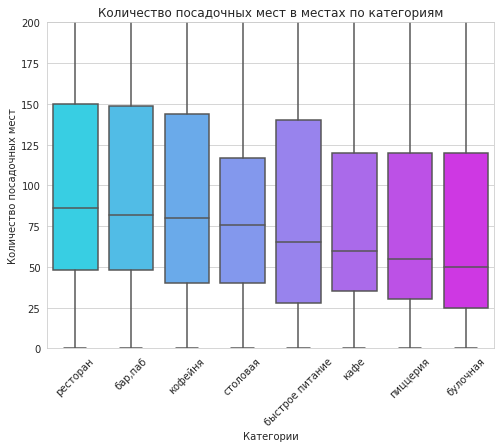

In [32]:
plt.figure(figsize=(8, 6))
list_ord_seat = list(data.query('seats!=-1')
                 .pivot_table(index='category', values='seats', aggfunc='median')
                 .reset_index()
                 .sort_values(by='seats', ascending=False)
                 ['category']
                )
ax = sns.boxplot(x='category', y='seats', data=data.query('seats!=-1'), palette='cool', order=list_ord_seat)
plt.ylim(0, 200)
plt.xticks(rotation=45)
plt.xlabel('Категории')
plt.ylabel('Количество посадочных мест')
plt.title('Количество посадочных мест в местах по категориям')

Text(0.5, 1.0, 'Количество посадочных мест в местах по категориям')

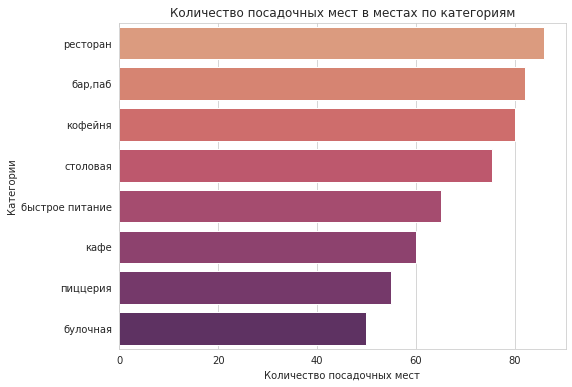

In [33]:
table_seat = (data
              .query('seats!=-1')
              .pivot_table(index='category', values='seats', aggfunc='median')
              .reset_index()
              .sort_values(by='seats', ascending=False))
plt.figure(figsize=(8, 6))
ax = sns.barplot(y='category', x='seats', data=table_seat, palette='flare')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категории')
plt.title('Количество посадочных мест в местах по категориям')

Понятно, что в булочной или пиццерии люди не задерживаются. Наибольшее количество посадочных мест в ресторанах, возможно, это вызвано тем, что люди там задерживаются надолго, а поток посетителей, например, в выходные достаточно объёмный.

### Соотношение сетевых и несетевых заведений <a id="netnotnet"></a>

In [34]:
net = data.query('chain==1')['chain'].count()
notnet = data.query('chain==0')['chain'].count()
arr = [net, notnet]
names = ['Сетевые заведения', 'Несетевые заведения']

fig = go.Figure(data=[go.Pie(labels=names, values=arr)])
fig.update_layout(title='Соотношение сетевых и несетевых заведений',
                  width=800,
                  height=600,
                  annotations=[dict(x=1.12,
                                    y=1.05,
                                    text='Тип заведений',
                                    showarrow=False)])
fig.show()

Исходя из данных несетевых заведений больше - их 62% от общего количества, а сетевых - 38%

### Распределение категорий сетевых заведений <a id="onlynetcat"></a>

Text(0.5, 1.0, 'Доля сетевых заведений по категориям')

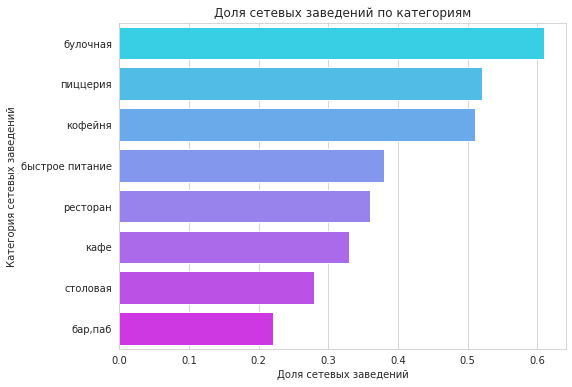

In [35]:
table_all = (data
                  .pivot_table(index='category', values='name', aggfunc='count')
                 )
table_part_net = (data
                  .pivot_table(index='category', values='chain', aggfunc='sum')
                 )
table_part_net['part'] = round(table_part_net['chain']/table_all['name'], 2)
table_part_net = table_part_net.reset_index().sort_values(by='part', ascending=False)
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='part', y='category', data=table_part_net, palette='cool')
plt.xlabel('Доля сетевых заведений')
plt.ylabel('Категория сетевых заведений')
plt.title('Доля сетевых заведений по категориям')

Довольно интересный результат - количество сетевых заведений среди булочных преобладает, для пиццерий, кофеен и ресторанов быстрого питания большая доля сетевых заведений более понятна

### Топ-15 популярных сетей в Москве <a id="nets"></a>

Text(0.5, 1.0, 'Топ-15 популярных сетей в Москве')

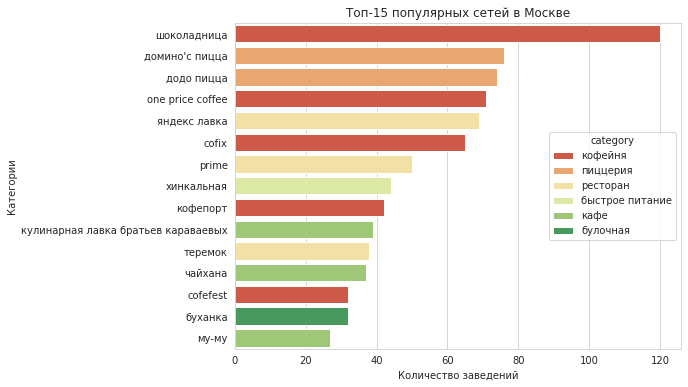

In [36]:
table_pop_net1 = (data
                 .query('chain==1')
                 .pivot_table(index='name', values='category', aggfunc=['count', 'first'])
                 .reset_index()
                )
table_pop_net1.columns = ['name', 'count', 'category']
table_pop_net1 = table_pop_net1.sort_values(by='count', ascending=False).head(15)
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='count', y='name', data=table_pop_net1, hue='category', palette='RdYlGn', dodge=False)
plt.xlabel('Количество заведений')
plt.ylabel('Категории')
plt.title('Топ-15 популярных сетей в Москве')

Лидером среди сетевых заведений является Шоколадница. В основном здесь представлены места, куда можно прийти в любое время с друзьями, семьёй и близкими без брони, данные заведения предлагают свои услуги в довольно доступной ценовой категории.

### Количество заведений каждой категории по районам <a id="catregion"></a>

In [37]:
table_cat_reg = (data
                 .pivot_table(index=['district', 'category'], values='name', aggfunc='count')
                 .reset_index()
                )
#table_cat_reg
fig = px.bar(table_cat_reg.sort_values(by='name', ascending=False), x='district',
             y='name',
             color='category',
             text='name'
            )
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Район',  
                   width=900, 
                   height=800
                 )
fig.update_layout(xaxis={"categoryorder":"total descending"})
fig.show()

В Центральном административном округе наибольшее количество заведений, это логично, поскольку центр - наиболее посещаемое и популярное место отдыха в Москве.

### Распределение средних рейтингов по категориям заведений <a id="avcat"></a>

In [38]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8401 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8401 non-null   object 
 1   category           8401 non-null   object 
 2   address            8401 non-null   object 
 3   district           8401 non-null   object 
 4   hours              7866 non-null   object 
 5   lat                8401 non-null   float64
 6   lng                8401 non-null   float64
 7   rating             8401 non-null   float64
 8   price              3314 non-null   object 
 9   avg_bill           3815 non-null   object 
 10  middle_avg_bill    3148 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8401 non-null   int64  
 13  seats              8401 non-null   int64  
 14  street             8401 non-null   object 
 15  is_24_7            8401 non-null   bool   
dtypes: bool(1), float64(5), 

In [39]:
table_avg = (data
             .pivot_table(index='category', values='rating', aggfunc='mean')
             .reset_index()
)
table_avg

,category,rating
0,"бар,паб",4.387696
1,булочная,4.268359
2,быстрое питание,4.050249
3,кафе,4.124285
4,кофейня,4.277282
5,пиццерия,4.301264
6,ресторан,4.290495
7,столовая,4.211429


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'быстрое питание'),
  Text(1, 0, 'кафе'),
  Text(2, 0, 'столовая'),
  Text(3, 0, 'булочная'),
  Text(4, 0, 'кофейня'),
  Text(5, 0, 'ресторан'),
  Text(6, 0, 'пиццерия'),
  Text(7, 0, 'бар,паб')])

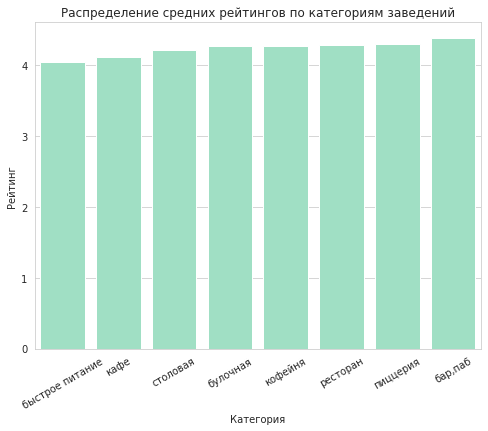

In [40]:
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='category', y='rating', data=table_avg.sort_values(by='rating'), color='#96E9C6')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xticks(rotation=30)

Как мы видим средние рейтинги по категориям не сильно отличаются

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района <a id="choroav"></a>

In [41]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8401 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8401 non-null   object 
 1   category           8401 non-null   object 
 2   address            8401 non-null   object 
 3   district           8401 non-null   object 
 4   hours              7866 non-null   object 
 5   lat                8401 non-null   float64
 6   lng                8401 non-null   float64
 7   rating             8401 non-null   float64
 8   price              3314 non-null   object 
 9   avg_bill           3815 non-null   object 
 10  middle_avg_bill    3148 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8401 non-null   int64  
 13  seats              8401 non-null   int64  
 14  street             8401 non-null   object 
 15  is_24_7            8401 non-null   bool   
dtypes: bool(1), float64(5), 

In [42]:
table_rate = data.groupby('district', as_index=False)['rating'].agg('mean')
table_rate.sort_values(by='rating')

,district,rating
6,Юго-Восточный административный округ,4.101120
3,Северо-Восточный административный округ,4.147978
7,Юго-Западный административный округ,4.172920
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
8,Южный административный округ,4.184512
4,Северо-Западный административный округ,4.208802
2,Северный административный округ,4.240980
5,Центральный административный округ,4.377520


In [43]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=table_rate,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

###  Все заведения датасета на карте <a id="cart"></a>

In [44]:
ma = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(ma)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
data.apply(create_clusters, axis=1)
ma

### Топ-15 улиц по количеству заведений <a id="15streets"></a>

In [45]:
table_street_count = (data
                 .query('street!="нет улицы"') 
                 .pivot_table(index='street', values='name', aggfunc='count')
                 .reset_index()
                 .sort_values(by='name', ascending=False)
                 .head(15)
                )
table_street_count

,street,name
837,проспект мира,183
841,профсоюзная улица,122
834,проспект вернадского,108
533,ленинский проспект,107
531,ленинградский проспект,95
379,дмитровское шоссе,88
461,каширское шоссе,76
304,варшавское шоссе,76
532,ленинградское шоссе,70
610,мкад,65


In [46]:
table_cat_street = (data
                 .query('street!="нет улицы"') 
                 .pivot_table(index=['street', 'category'], values='name', aggfunc='count')
                 .reset_index()
                )
list_street = list(table_street_count["street"])
table_cat_street = table_cat_street.query('street in @list_street')
table_cat_street

,street,category,name
698,варшавское шоссе,"бар,паб",6
699,варшавское шоссе,быстрое питание,7
700,варшавское шоссе,кафе,18
701,варшавское шоссе,кофейня,14
702,варшавское шоссе,пиццерия,4
...,...,...,...
3174,улица миклухо-маклая,быстрое питание,4
3175,улица миклухо-маклая,кафе,21
3176,улица миклухо-маклая,кофейня,4
3177,улица миклухо-маклая,пиццерия,2


In [47]:
fig = px.bar(table_cat_street,
             x='street',
             y='name',
             color='category',
             text='name'
            )
fig.update_layout(title='Количество заведений каждой категории по улицам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Район',  
                   width=900, 
                   height=800
                 )
fig.update_layout(xaxis = dict(categoryorder="total descending"))
fig.show()

Наибольшее количество заведений находится на проспекте Мира, так же заметно, что на всех улицах кафе, рестораны и кофейни превуалируют над количеством других заведений, значит если рассматривать в подобном разрезе на популярность категорий заведений, то всё в целом не меняется, кроме, например, мкада, тут очень мало ресторанов, но всё так же много кафе

### Улицы, на которых находится только один объект общепита <a id="only1"></a>

Псомотрим, где находятся эти улицы

In [48]:
table_only =(data
             .pivot_table(index='street', values='name', aggfunc='count')
             .reset_index()
             .query('name==1')
            )
table_only

,street,name
0,1-й автозаводский проезд,1
1,1-й балтийский переулок,1
2,1-й варшавский проезд,1
3,1-й вешняковский проезд,1
5,1-й голутвинский переулок,1
...,...,...
1425,электрический переулок,1
1432,юго-западный административный округ,1
1437,якиманский переулок,1
1438,яковоапостольский переулок,1


In [49]:
list_only = list(table_only['street'])

In [50]:
map_only = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster_only = MarkerCluster().add_to(map_only)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_only)
    
data.query('street in @list_only').apply(create_clusters, axis=1)
map_only

In [51]:
table_only_price = data.query('street in @list_only').groupby('price', as_index=False)['name'].agg('count')
table_only_price

,price,name
0,высокие,22
1,выше среднего,29
2,низкие,11
3,средние,120


(array([0, 1, 2, 3]),
 [Text(0, 0, 'низкие'),
  Text(1, 0, 'высокие'),
  Text(2, 0, 'выше среднего'),
  Text(3, 0, 'средние')])

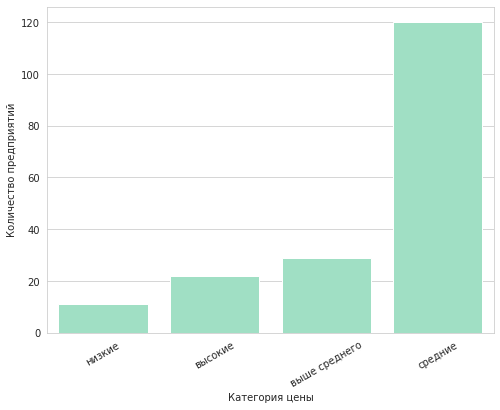

In [52]:
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='price', y='name', data=table_only_price.sort_values(by='name'), color='#96E9C6')
plt.xlabel('Категория цены')
plt.ylabel('Количество предприятий')
plt.xticks(rotation=30)

In [53]:
table_cat_only = data.query('street in @list_only').groupby('category', as_index=False)['name'].agg('count')
table_cat_only

,category,name
0,"бар,паб",39
1,булочная,8
2,быстрое питание,23
3,кафе,159
4,кофейня,84
5,пиццерия,15
6,ресторан,93
7,столовая,36


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'булочная'),
  Text(1, 0, 'пиццерия'),
  Text(2, 0, 'быстрое питание'),
  Text(3, 0, 'столовая'),
  Text(4, 0, 'бар,паб'),
  Text(5, 0, 'кофейня'),
  Text(6, 0, 'ресторан'),
  Text(7, 0, 'кафе')])

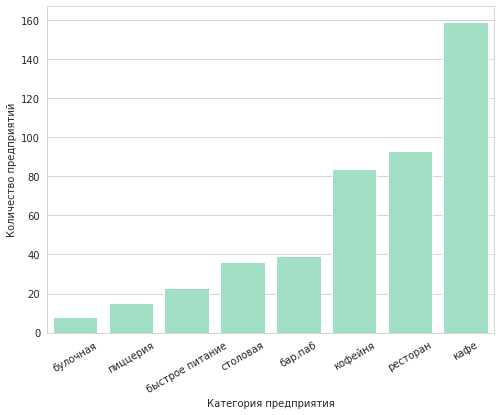

In [54]:
plt.figure(figsize=(8, 6))
ax = sns.barplot(x='category', y='name', data=table_cat_only.sort_values(by='name'), color='#96E9C6')
plt.xlabel('Категория предприятия')
plt.ylabel('Количество предприятий')
plt.xticks(rotation=30)

Возможно, большинство таких заведений находятся в жилых районах, это исходит из того, что категория цены в подавляющием количестве случаев средняя, информация на карте тоже учтена, следовательно на подобных улицах зачастую много предприятий не бывает ввиду неблольшого потока людей.

### Анализ средних чеков по зваедениям <a id="avcheck"></a>

In [55]:
table_reg_bill = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
table_reg_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [56]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

map_reg = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=table_reg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Средний чек по районам',
).add_to(map_reg)

map_reg

Исходя из таблицы с районами и средними чеками, можно сказать, что в Центральном и Западном АО цены определённо выше, чем в остальных районах.

### Вывод <a id="allinall"></a>

Наиболее распространёнными категориями заведений стали кафе и рестораны, они, в свою очередь, обычно предлагают полноценное обслуживание, включая подачу блюд к столу, создавая атмосферу для отдыха и развлечения, а вот булочные и столовые менее популярны в связи с последними тенденциями, ресторанов быстрого питания не так много, относительно кафе и ресторанов, поскольку в этой сфере преобладает определённое количество сетевых заведений, у остальных редко увидишь и пару посетителей даже на выходных (хотя, возможно, это вызвано тем, что в данных представлены не все заведения быстрого питания). Кофейни имеют огромную популярность в последнее время, поэтому они тоже в топе.

Понятно, что в булочной или пиццерии люди не задерживаются. Наибольшее количество посадочных мест в ресторанах, возможно, это вызвано тем, что люди там задерживаются надолго, а поток посетителей, например, в выходные достаточно объёмный.

Исходя из данных несетевых заведений больше - их 62% от общего количества, а сетевых - 38%.

Среди сетевых заведений наиболее распространены кафе, рестораны и кофейни, а столовые и булочные - наименее.

Лидером среди сетевых заведений является Шоколадница. В основном, заведения популярных сетей - места, куда можно прийти в любое время с друзьями, семьёй и близкими без брони, данные заведения предлагают свои услуги в довольно доступной ценовой категории.

В Центральном административном округе наибольшее количество заведений, это логично, поскольку центр - наиболее посещаемое и популярное место отдыха в Москве.

Средний рейтинг почти не зависит от категории заведения.

Наиболее выскоий рейтинг заведений в Центральном административном округе, а наиболее низкий - в Юго-Восточном административном округе.

Топ 15 улиц по количеству заведений: 
- Проспект мира
- Профсоюзная улица
- Проспект вернадского
- Ленинский проспект
- Ленинградский проспект
- Дмитровское шоссе
- Каширское шоссе
- Варшавское шоссе
- Ленинградское шоссе
- мкад
- Люблинская улица
- улица Вавилова
- Кутузовский проспект
- улица Миклухо-Маклая
- Пятницкая улица

Касательно заведений, единственных на своей улице. Большинство таких заведений находятся в жилых районах, это исходит из того, что категория цены в подавляющием количестве случаев средняя, информация на карте тоже учтена, следовательно на подобных улицах зачастую много предприятий не бывает ввиду неблольшого потока людей.

В Центральном и Западном АО цены определённо выше, чем в остальных районах

## Детализация исследования <a id="freeanalysis"></a>

**Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?**

In [57]:
data.query('category=="кофейня"')['name'].count()

1413

В датасете всего 1413 кофеен

In [58]:
table_coffe = (data
               .query('category=="кофейня"')
               .pivot_table(index='district', values='name', aggfunc='count')
               .reset_index()
               .sort_values(by='name', ascending=False)
              )
table_coffe

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Text(0.5, 1.0, 'Количество кофеен в каждом районе')

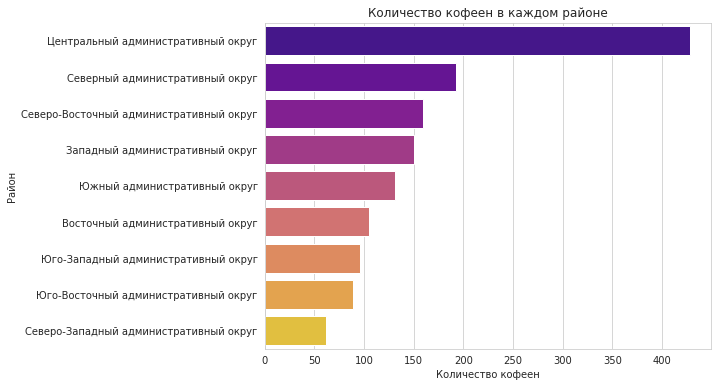

In [59]:
plt.figure(figsize=(8, 6))
ax = sns.barplot(data=table_coffe, x='name', y='district', palette='plasma')
plt.xlabel('Количество кофеен')
plt.ylabel('Район')
plt.title('Количество кофеен в каждом районе')

Больше всего кофеен в Центральном АО, это лочгично, ведь наибольший поток людей в столице

In [60]:
map_coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster_coffee = MarkerCluster().add_to(map_coffee)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_coffee)
    
data.query('category=="кофейня"').apply(create_clusters, axis=1)
map_coffee

Чаще всего подобные заведения находятся в небольших зданиях с входом, доступным для прохода с улицы, это сделано для того, чтобы люди по дороге куда-либо могли достаточно быстро зайти, а потом отправиться по своим делам. Также, проанализировав карту с отмеченными на ней кофейнями, можно сказать, что большинство заведений находятся ближе к главной части улицы, т.е. основной маршрут, где скапливается большое количество людей, идущих, например, к метро. Во внутренних частях кварталов кофейни можно найти реже.

**Есть ли круглосуточные кофейни?**

In [61]:
table_coffee_24 = data.query('category=="кофейня" & is_24_7==True')['name'].count()
table_coffee_not_24 = data.query('category=="кофейня" & is_24_7!=True')['name'].count()

val = [table_coffee_24, table_coffee_not_24]
name = ['Круглосуточные', 'Некруглосуточные']

fig = go.Figure(data=[go.Pie(labels=name, values=val, text=val)])
fig.update_layout(title='Соотношение круглосуточных и некруглосуточных заведений',
                  width=800,
                  height=600,
                  annotations=[dict(x=1.12,
                                    y=1.05,
                                    text='Тип заведений',
                                    showarrow=False)])
fig.show()

Подавляющее большинство кофеен не работают круглосуточно

**Какие у кофеен рейтинги? Как они распределяются по районам?**

In [62]:
reg_coffee_rate = (data
                   .query('category=="кофейня"')
                   .pivot_table(index='district', values='rating', aggfunc='mean')
                   .reset_index()
                   .sort_values(by='rating')
                  )
reg_coffee_rate

,district,rating
1,Западный административный округ,4.195333
3,Северо-Восточный административный округ,4.216981
6,Юго-Восточный административный округ,4.225843
8,Южный административный округ,4.232824
0,Восточный административный округ,4.282857
7,Юго-Западный административный округ,4.283333
2,Северный административный округ,4.291710
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336449


(3.25, 5.0)

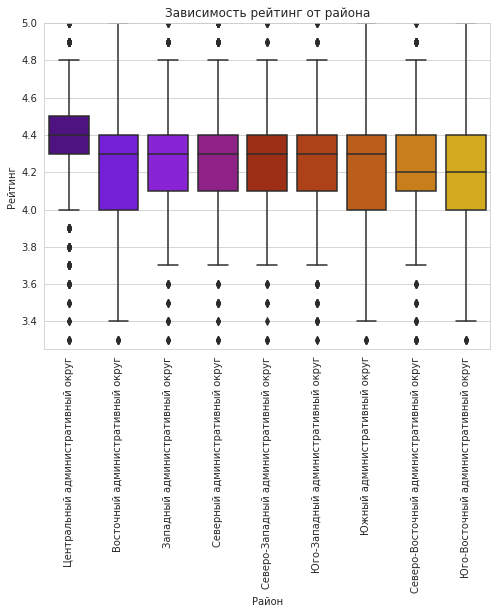

In [63]:
plt.figure(figsize=(8, 6))
rate_ord = list(data
            .pivot_table(index='district', values='rating', aggfunc='median')
            .reset_index()
            .sort_values(by='rating', ascending=False)
            ['district']
           )
ax = sns.boxplot(x='district', y='rating', data=data, palette='gnuplot', order=rate_ord)
plt.title('Зависимость рейтинг от района')
plt.xlabel('Район')
plt.ylabel('Рейтинг')
plt.xticks(rotation=90)
plt.ylim(3.25, 5)

Среди всех районов наиболее выделяется Центральный АО, здесь наиболее высокий рейтинг кофеен

**На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**

Посмотрим на зависимость стоимости чашки капучино от рейтинга

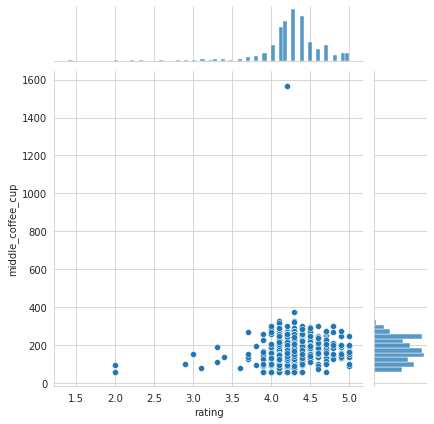

In [64]:
ax = sns.jointplot(data=data.query('category=="кофейня"'), x='rating', y='middle_coffee_cup')


Избавимся от выброса в стоимости чашки

Text(336.9714285714286, 0.5, 'Стоимость чашки капучино')

<Figure size 576x432 with 0 Axes>

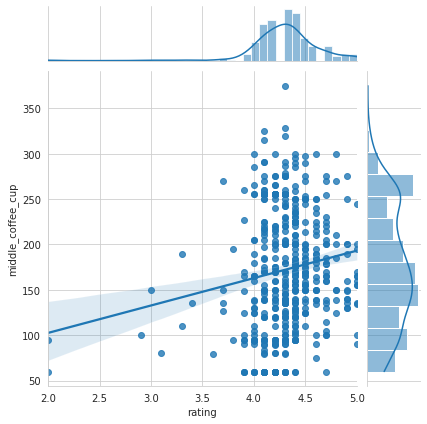

In [65]:
plt.figure(figsize=(8, 6))
ax = (sns
      .jointplot(data=data.query('category=="кофейня" & middle_coffee_cup<1000'),
                 x='rating',
                 y='middle_coffee_cup',
                 kind='reg')
     )
plt.xlabel('Рейтинг')
plt.ylabel('Стоимость чашки капучино')

Исходя их графика, в большинстве кофеен, имеющих рейтинг в районе 4.5, в большинстве случаев берут за чашку капучино в районе 150-200 рублей.
Посмотрим на среднюю и медианную стоимость чашки по районам

Text(0, 0.5, 'Стоимость чашки капучино')

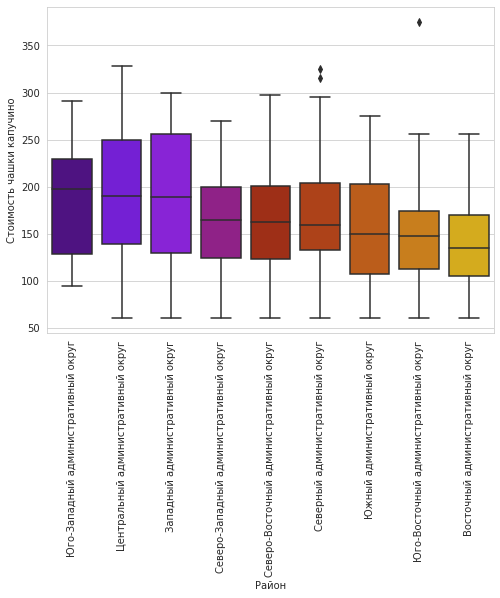

In [66]:
plt.figure(figsize=(8, 6))
cof_order = list(data
             .query('category=="кофейня" & middle_coffee_cup<1000')    
             .pivot_table(index='district', values='middle_coffee_cup', aggfunc='median')
             .reset_index()
             .sort_values(by='middle_coffee_cup', ascending=False)
             ['district']
            )
ax = (sns
      .boxplot(data=data.query('category=="кофейня" & middle_coffee_cup<1000'),
                 x='district',
                 y='middle_coffee_cup',
                 order=cof_order,
                 palette='gnuplot'
              )
     )
plt.xticks(rotation=90)
plt.xlabel('Район')
plt.ylabel('Стоимость чашки капучино')

In [67]:
table_coffee_avg = (data
                    .query('category=="кофейня" & middle_coffee_cup<1000')
                    .pivot_table(index='district', values='middle_coffee_cup', aggfunc='median')
                    .reset_index()
                    .sort_values(by='middle_coffee_cup', ascending=False)
)
table_coffee_avg

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


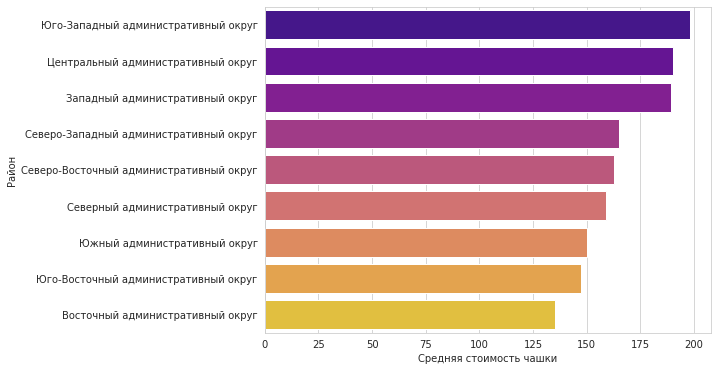

In [68]:
plt.figure(figsize=(8, 6))
ax = sns.barplot(data=table_coffee_avg, x='middle_coffee_cup', y='district', palette='plasma')
plt.xlabel('Средняя стоимость чашки')
plt.ylabel('Район')
plt.show()

Определяя цены в своём заведении, стоит руководствоваться местонахождением кофейни, ведь, как показывают данные, в Юго-Западном АО средняя цена чашки капучино достигает 198 рублей, а в Восточном АО средняя цена чашки находится в районе всего лишь 135 рублей

## Вывод <a id="allinallishe"></a>

- Всего 1413 кофеен в Москве согласно представленным данным
- Больше всего кофеен в Центральном АО, это логично, ведь наибольший поток людей в центре столицы
- Чаще всего подобные заведения находятся в небольших зданиях с входом, доступным для прохода с улицы, это сделано для того, чтобы люди по дороге куда-либо могли достаточно быстро зайти, а потом отправиться по своим делам. Также, проанализировав карту с отмеченными на ней кофейнями, можно сказать, что большинство заведений находятся ближе к главной части улицы, т.е. основной маршрут, где скапливается большое количество людей, идущих, например, к метро. Во внутренних частях кварталов кофейни можно найти реже
- Подавляющее большинство кофеен не работают круглосуточно
- Среди всех районов наиболее выделяется Центральный АО, здесь наиболее высокий рейтинг кофеен
- В большинстве кофеен, имеющих рейтинг в районе 4.5, в большинстве случаев берут за чашку капучино в районе 150-200 рублей
- Определяя цены в своём заведении, стоит руководствоваться местонахождением кофейни, ведь, как показывают данные, в Юго-Западном АО средняя цена чашки капучино достигает 198 рублей, а в Восточном АО средняя цена чашки находится в районе всего лишь 135 рублей
- В основном, заведения популярных сетей - места, куда можно прийти в любое время с друзьями, семьёй и близкими без брони, данные заведения предлагают свои услуги в довольно доступной ценовой категории

## Рекомендации <a id="reks"></a>

- Учитывая, что большинство кофеен находятся в небольших зданиях с доступом с улицы, важно выбрать место с высоким потоком пешеходного движения, таким как улицы, ведущие к метро или оживленные торговые районы
- Определение цен должно учитывать расположение кофейни. Например, в центре города цены могут быть выше, чем на окраинах. Рекомендуется установить конкурентоспособные цены, соответствующие среднему уровню цен в районе, с учетом предпочтений целевой аудитории, если есть желание сделать кофейню доступной, то и следует устанавить доступные цены, в среднем это 150 рублей по Москве за чашку кофе, так же можно предусмотреть уютный интерьер с достаточным количеством посадочных мест - от 60 до 80
- Учитывая средний чек по заведениям Москвы, чек в размер 500-800 рублей вполне подойдёт
- Не следует искать улицы для расположения заведения, где, например, только 1 кофейня, следует искать оживлённые районы, но учитывать конкуренцию 